# **Mounting Drive**

In [99]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **importing libraries**

In [100]:
!pip install category_encoders
!pip install datasist

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.8/81.8 kB 994.2 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 6.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 9.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 74.9 MB/s eta 0:00:00


In [101]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.preprocessing import OneHotEncoder
from category_encoders import BinaryEncoder
from sklearn.model_selection import train_test_split
from datasist.structdata import detect_outliers
from sklearn.preprocessing import RobustScaler
import matplotlib.pyplot as plt

# **Reading The DataSet**

link of my dataset from kaggle : https://www.kaggle.com/datasets/bartoszpieniak/poland-cars-for-sale-dataset/code

# **Cloumns description**
-ID - unique ID of offer
-Price - value of the price
-Currency - currency of the price (mostly polish złoty, but also some euro)
-Condition - new or used
-Vehicle_brand - brand of vehicle in offer
-Vehicle_model - model of vehicle in offer
-Vehicle_generation - generation of vehicle in offer
-Vehicle_version - version of vehicle in offer
-Production_year - year of car production
-Mileage_km - total distance that the car has driven in kilometers
-Power_HP - car engine power in horsepower
-Displacement_cm3 - car engine size in cubic centimeters
-Fuel_type - car fuel type
-CO2_emissions - car CO2 emissions in g/km
-Drive - type of car drive
-Transmission - type of car transmission
-Type - car body style
-Doors_number - number of car doors
-Colour - car body color
-Origin_country - country of origin of the car
-First_owner - whether the owner is the first owner
-First_registration_date - date of first registration
-Offer_publication_date - date of publication of the offer
-Offer_location - address provided by the issuer
-Features - listed car features (ABS, airbag, parking sensors e.t.c)

In [102]:
data=pd.read_csv('/content/drive/MyDrive/my projectdata/Car_sale_ads.csv')

# **Showing the head of the data**

In [103]:
data.head()



,Index,Price,Currency,Condition,Vehicle_brand,Vehicle_model,Vehicle_version,Vehicle_generation,Production_year,Mileage_km,...,Transmission,Type,Doors_number,Colour,Origin_country,First_owner,First_registration_date,Offer_publication_date,Offer_location,Features
0,0,86200,PLN,New,Abarth,595,NaN,NaN,2021,1.0,...,Manual,small_cars,3.0,gray,NaN,NaN,NaN,4/5/2021,"ul. Jubilerska 6 - 04-190 Warszawa, Mazowiecki...",[]
1,1,43500,PLN,Used,Abarth,Other,NaN,NaN,1974,59000.0,...,Manual,coupe,2.0,silver,NaN,NaN,NaN,3/5/2021,"kanonierska12 - 04-425 Warszawa, Rembertów (Po...",[]
2,2,44900,PLN,Used,Abarth,500,NaN,NaN,2018,52000.0,...,Automatic,small_cars,3.0,silver,NaN,NaN,NaN,3/5/2021,"Warszawa, Mazowieckie, Białołęka","['ABS', 'Electric front windows', 'Drivers air..."
3,3,39900,PLN,Used,Abarth,500,NaN,NaN,2012,29000.0,...,Manual,small_cars,3.0,gray,NaN,NaN,NaN,30/04/2021,"Jaworzno, Śląskie","['ABS', 'Electric front windows', 'Drivers air..."
4,4,97900,PLN,New,Abarth,595,NaN,NaN,2021,600.0,...,Manual,small_cars,3.0,blue,NaN,NaN,NaN,30/04/2021,"ul. Gorzysława 9 - 61-057 Poznań, Nowe Miasto ...","['ABS', 'Electrically adjustable mirrors', 'Pa..."


,Index,Price,Currency,Condition,Vehicle_brand,Vehicle_model,Vehicle_version,Vehicle_generation,Production_year,Mileage_km,...,Transmission,Type,Doors_number,Colour,Origin_country,First_owner,First_registration_date,Offer_publication_date,Offer_location,Features
0,0,86200,PLN,New,Abarth,595,NaN,NaN,2021,1.0,...,Manual,small_cars,3.0,gray,NaN,NaN,NaN,4/5/2021,"ul. Jubilerska 6 - 04-190 Warszawa, Mazowiecki...",[]
1,1,43500,PLN,Used,Abarth,Other,NaN,NaN,1974,59000.0,...,Manual,coupe,2.0,silver,NaN,NaN,NaN,3/5/2021,"kanonierska12 - 04-425 Warszawa, Rembertów (Po...",[]
2,2,44900,PLN,Used,Abarth,500,NaN,NaN,2018,52000.0,...,Automatic,small_cars,3.0,silver,NaN,NaN,NaN,3/5/2021,"Warszawa, Mazowieckie, Białołęka","['ABS', 'Electric front windows', 'Drivers air..."
3,3,39900,PLN,Used,Abarth,500,NaN,NaN,2012,29000.0,...,Manual,small_cars,3.0,gray,NaN,NaN,NaN,30/04/2021,"Jaworzno, Śląskie","['ABS', 'Electric front windows', 'Drivers air..."
4,4,97900,PLN,New,Abarth,595,NaN,NaN,2021,600.0,...,Manual,small_cars,3.0,blue,NaN,NaN,NaN,30/04/2021,"ul. Gorzysława 9 - 61-057 Poznań, Nowe Miasto ...","['ABS', 'Electrically adjustable mirrors', 'Pa..."


In [104]:
data.shape

(208303, 25)

(208303, 25)

In [105]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 208303 entries, 0 to 208302
Data columns (total 25 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   Index                    208303 non-null  int64  
 1   Price                    208303 non-null  int64  
 2   Currency                 208303 non-null  object 
 3   Condition                208303 non-null  object 
 4   Vehicle_brand            208303 non-null  object 
 5   Vehicle_model            208303 non-null  object 
 6   Vehicle_version          138082 non-null  object 
 7   Vehicle_generation       147860 non-null  object 
 8   Production_year          208303 non-null  int64  
 9   Mileage_km               207320 non-null  float64
 10  Power_HP                 207660 non-null  float64
 11  Displacement_cm3         206337 non-null  float64
 12  Fuel_type                208303 non-null  object 
 13  CO2_emissions            94047 non-null   float64
 14  Driv

In [106]:
data.describe()

,Index,Price,Production_year,Mileage_km,Power_HP,Displacement_cm3,CO2_emissions,Doors_number
count,208303.000000,2.083030e+05,208303.000000,2.073200e+05,207660.000000,206337.000000,9.404700e+04,206816.000000
mean,104151.638306,6.305392e+04,2012.098237,1.502769e+05,151.836362,1882.568560,3.191564e+05,4.637136
std,60132.440782,8.665987e+04,6.998430,2.937454e+06,77.683724,729.611146,7.291396e+07,0.768560
min,0.000000,5.000000e+02,1915.000000,1.000000e+00,1.000000,400.000000,1.000000e+00,1.000000
25%,52075.500000,1.780000e+04,2008.000000,5.300000e+04,105.000000,1461.000000,1.200000e+02,5.000000
50%,104152.000000,3.570000e+04,2013.000000,1.445665e+05,136.000000,1798.000000,1.400000e+02,5.000000
75%,156227.500000,7.599000e+04,2017.000000,2.060000e+05,172.000000,1997.000000,1.640000e+02,5.000000
max,208303.000000,6.999000e+06,2021.000000,1.111111e+09,1398.000000,8400.000000,2.000000e+10,55.000000


,Index,Price,Production_year,Mileage_km,Power_HP,Displacement_cm3,CO2_emissions,Doors_number
count,208303.000000,2.083030e+05,208303.000000,2.073200e+05,207660.000000,206337.000000,9.404700e+04,206816.000000
mean,104151.638306,6.305392e+04,2012.098237,1.502769e+05,151.836362,1882.568560,3.191564e+05,4.637136
std,60132.440782,8.665987e+04,6.998430,2.937454e+06,77.683724,729.611146,7.291396e+07,0.768560
min,0.000000,5.000000e+02,1915.000000,1.000000e+00,1.000000,400.000000,1.000000e+00,1.000000
25%,52075.500000,1.780000e+04,2008.000000,5.300000e+04,105.000000,1461.000000,1.200000e+02,5.000000
50%,104152.000000,3.570000e+04,2013.000000,1.445665e+05,136.000000,1798.000000,1.400000e+02,5.000000
75%,156227.500000,7.599000e+04,2017.000000,2.060000e+05,172.000000,1997.000000,1.640000e+02,5.000000
max,208303.000000,6.999000e+06,2021.000000,1.111111e+09,1398.000000,8400.000000,2.000000e+10,55.000000


In [107]:
data.columns

Index(['Index', 'Price', 'Currency', 'Condition', 'Vehicle_brand',
       'Vehicle_model', 'Vehicle_version', 'Vehicle_generation',
       'Production_year', 'Mileage_km', 'Power_HP', 'Displacement_cm3',
       'Fuel_type', 'CO2_emissions', 'Drive', 'Transmission', 'Type',
       'Doors_number', 'Colour', 'Origin_country', 'First_owner',
       'First_registration_date', 'Offer_publication_date', 'Offer_location',
       'Features'],
      dtype='object')

Index(['Index', 'Price', 'Currency', 'Condition', 'Vehicle_brand',
       'Vehicle_model', 'Vehicle_version', 'Vehicle_generation',
       'Production_year', 'Mileage_km', 'Power_HP', 'Displacement_cm3',
       'Fuel_type', 'CO2_emissions', 'Drive', 'Transmission', 'Type',
       'Doors_number', 'Colour', 'Origin_country', 'First_owner',
       'First_registration_date', 'Offer_publication_date', 'Offer_location',
       'Features'],
      dtype='object')

# **Drop the unwanted Columns from the data **

In [108]:
data.drop(['Features','Displacement_cm3','Offer_location','Offer_publication_date','Vehicle_version','Index','First_owner','First_registration_date','CO2_emissions','Vehicle_generation','Origin_country','Drive'], axis=1 , inplace=True)

# **Check the percentage of the Null values in th data**

In [109]:
data.isna().sum()

Price                 0
Currency              0
Condition             0
Vehicle_brand         0
Vehicle_model         0
Production_year       0
Mileage_km          983
Power_HP            643
Fuel_type             0
Transmission        479
Type                  0
Doors_number       1487
Colour                0
dtype: int64

Price                 0
Currency              0
Condition             0
Vehicle_brand         0
Vehicle_model         0
Production_year       0
Mileage_km          983
Power_HP            643
Fuel_type             0
Transmission        479
Type                  0
Doors_number       1487
Colour                0
dtype: int64

In [110]:
data.isnull().mean()*100

Price              0.000000
Currency           0.000000
Condition          0.000000
Vehicle_brand      0.000000
Vehicle_model      0.000000
Production_year    0.000000
Mileage_km         0.471909
Power_HP           0.308685
Fuel_type          0.000000
Transmission       0.229953
Type               0.000000
Doors_number       0.713864
Colour             0.000000
dtype: float64

Price              0.000000
Currency           0.000000
Condition          0.000000
Vehicle_brand      0.000000
Vehicle_model      0.000000
Production_year    0.000000
Mileage_km         0.471909
Power_HP           0.308685
Fuel_type          0.000000
Transmission       0.229953
Type               0.000000
Doors_number       0.713864
Colour             0.000000
dtype: float64

In [111]:
data.dropna(inplace=True, axis=0)

In [112]:
data.isnull().mean()*100

Price              0.0
Currency           0.0
Condition          0.0
Vehicle_brand      0.0
Vehicle_model      0.0
Production_year    0.0
Mileage_km         0.0
Power_HP           0.0
Fuel_type          0.0
Transmission       0.0
Type               0.0
Doors_number       0.0
Colour             0.0
dtype: float64

Price              0.0
Currency           0.0
Condition          0.0
Vehicle_brand      0.0
Vehicle_model      0.0
Production_year    0.0
Mileage_km         0.0
Power_HP           0.0
Fuel_type          0.0
Transmission       0.0
Type               0.0
Doors_number       0.0
Colour             0.0
dtype: float64

In [113]:
data.shape

(205546, 13)

(205546, 13)

# **Check For the Duplicates and drop them**

In [114]:
data.duplicated().sum()

3233

3233

In [115]:
data.drop_duplicates(inplace=True)

In [116]:
data.reset_index(inplace=True,drop=True)


In [117]:
data.count()

Price              202313
Currency           202313
Condition          202313
Vehicle_brand      202313
Vehicle_model      202313
Production_year    202313
Mileage_km         202313
Power_HP           202313
Fuel_type          202313
Transmission       202313
Type               202313
Doors_number       202313
Colour             202313
dtype: int64

Price              202313
Currency           202313
Condition          202313
Vehicle_brand      202313
Vehicle_model      202313
Production_year    202313
Mileage_km         202313
Power_HP           202313
Fuel_type          202313
Transmission       202313
Type               202313
Doors_number       202313
Colour             202313
dtype: int64

# **Number Of unique Values in every column**

In [118]:
data.nunique()

Price              13662
Currency               2
Condition              2
Vehicle_brand        108
Vehicle_model       1198
Production_year       92
Mileage_km         51722
Power_HP             572
Fuel_type              8
Transmission           2
Type                   9
Doors_number          10
Colour                14
dtype: int64

Price              13662
Currency               2
Condition              2
Vehicle_brand        108
Vehicle_model       1198
Production_year       92
Mileage_km         51722
Power_HP             572
Fuel_type              8
Transmission           2
Type                   9
Doors_number          10
Colour                14
dtype: int64

# **Features Engineering**

# Convert all the currencies to PLN

In [119]:
data["Currency"].value_counts()

PLN    202080
EUR       233
Name: Currency, dtype: int64

PLN    202080
EUR       233
Name: Currency, dtype: int64

In [120]:

def convert_to_eur(currency, price):
    if currency == 'EUR':
        return price / 4.44
    else:
        return price

# Apply the function to the Price column, passing in the Currency column as a second argument
data['Price_PLN'] = data[['Currency', 'Price']].apply(lambda x: convert_to_eur(*x), axis=1)


In [121]:
data.head(5)

,Price,Currency,Condition,Vehicle_brand,Vehicle_model,Production_year,Mileage_km,Power_HP,Fuel_type,Transmission,Type,Doors_number,Colour,Price_PLN
0,86200,PLN,New,Abarth,595,2021,1.0,145.0,Gasoline,Manual,small_cars,3.0,gray,86200.0
1,43500,PLN,Used,Abarth,Other,1974,59000.0,75.0,Gasoline,Manual,coupe,2.0,silver,43500.0
2,44900,PLN,Used,Abarth,500,2018,52000.0,180.0,Gasoline,Automatic,small_cars,3.0,silver,44900.0
3,39900,PLN,Used,Abarth,500,2012,29000.0,160.0,Gasoline,Manual,small_cars,3.0,gray,39900.0
4,97900,PLN,New,Abarth,595,2021,600.0,165.0,Gasoline,Manual,small_cars,3.0,blue,97900.0


,Price,Currency,Condition,Vehicle_brand,Vehicle_model,Production_year,Mileage_km,Power_HP,Fuel_type,Transmission,Type,Doors_number,Colour,Price_PLN
0,86200,PLN,New,Abarth,595,2021,1.0,145.0,Gasoline,Manual,small_cars,3.0,gray,86200.0
1,43500,PLN,Used,Abarth,Other,1974,59000.0,75.0,Gasoline,Manual,coupe,2.0,silver,43500.0
2,44900,PLN,Used,Abarth,500,2018,52000.0,180.0,Gasoline,Automatic,small_cars,3.0,silver,44900.0
3,39900,PLN,Used,Abarth,500,2012,29000.0,160.0,Gasoline,Manual,small_cars,3.0,gray,39900.0
4,97900,PLN,New,Abarth,595,2021,600.0,165.0,Gasoline,Manual,small_cars,3.0,blue,97900.0


# Drop the unwanted columns

In [122]:
data.drop(['Currency','Price'], axis=1 , inplace=True)

In [123]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202313 entries, 0 to 202312
Data columns (total 12 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   Condition        202313 non-null  object 
 1   Vehicle_brand    202313 non-null  object 
 2   Vehicle_model    202313 non-null  object 
 3   Production_year  202313 non-null  int64  
 4   Mileage_km       202313 non-null  float64
 5   Power_HP         202313 non-null  float64
 6   Fuel_type        202313 non-null  object 
 7   Transmission     202313 non-null  object 
 8   Type             202313 non-null  object 
 9   Doors_number     202313 non-null  float64
 10  Colour           202313 non-null  object 
 11  Price_PLN        202313 non-null  float64
dtypes: float64(4), int64(1), object(7)
memory usage: 18.5+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 202313 entries, 0 to 202312
Data columns (total 12 columns):
 #   Column           Non-Null Count   Dtype  
---  -----

In [124]:
data['Production_year'].unique()

array([2021, 1974, 2018, 2012, 2016, 2019, 2010, 2017, 2015, 2014, 2020,
       2009, 2013, 2011, 2008, 2003, 2007, 2000, 2005, 2004, 2002, 1999,
       2001, 2006, 1994, 1998, 1997, 1991, 1995, 1993, 1973, 1971, 1990,
       1987, 1992, 1996, 1983, 1979, 1986, 1989, 1970, 1984, 1988, 1980,
       1978, 1985, 1982, 1977, 1975, 1976, 1968, 1950, 1981, 1964, 1969,
       1965, 1958, 1959, 1967, 1961, 1966, 1957, 1972, 1956, 1960, 1949,
       1962, 1934, 1930, 1952, 1953, 1922, 1954, 1963, 1955, 1926, 1923,
       1925, 1938, 1945, 1915, 1924, 1928, 1947, 1951, 1936, 1948, 1937,
       1946, 1927, 1935, 1933])

array([2021, 1974, 2018, 2012, 2016, 2019, 2010, 2017, 2015, 2014, 2020,
       2009, 2013, 2011, 2008, 2003, 2007, 2000, 2005, 2004, 2002, 1999,
       2001, 2006, 1994, 1998, 1997, 1991, 1995, 1993, 1973, 1971, 1990,
       1987, 1992, 1996, 1983, 1979, 1986, 1989, 1970, 1984, 1988, 1980,
       1978, 1985, 1982, 1977, 1975, 1976, 1968, 1950, 1981, 1964, 1969,
       1965, 1958, 1959, 1967, 1961, 1966, 1957, 1972, 1956, 1960, 1949,
       1962, 1934, 1930, 1952, 1953, 1922, 1954, 1963, 1955, 1926, 1923,
       1925, 1938, 1945, 1915, 1924, 1928, 1947, 1951, 1936, 1948, 1937,
       1946, 1927, 1935, 1933])

In [125]:
data[data["Production_year"]<2000].count()

Condition          5544
Vehicle_brand      5544
Vehicle_model      5544
Production_year    5544
Mileage_km         5544
Power_HP           5544
Fuel_type          5544
Transmission       5544
Type               5544
Doors_number       5544
Colour             5544
Price_PLN          5544
dtype: int64

Condition          5544
Vehicle_brand      5544
Vehicle_model      5544
Production_year    5544
Mileage_km         5544
Power_HP           5544
Fuel_type          5544
Transmission       5544
Type               5544
Doors_number       5544
Colour             5544
Price_PLN          5544
dtype: int64

# Drop all the data before 2000

In [126]:
data = data.drop(data[data['Production_year'] <2000].index)

In [127]:
data['Production_year'].unique()

array([2021, 2018, 2012, 2016, 2019, 2010, 2017, 2015, 2014, 2020, 2009,
       2013, 2011, 2008, 2003, 2007, 2000, 2005, 2004, 2002, 2001, 2006])

array([2021, 2018, 2012, 2016, 2019, 2010, 2017, 2015, 2014, 2020, 2009,
       2013, 2011, 2008, 2003, 2007, 2000, 2005, 2004, 2002, 2001, 2006])

# Try to minimze the numer of vechile brand

In [128]:
data['Vehicle_brand'].value_counts()

Volkswagen    17289
BMW           15851
Opel          15806
Audi          15679
Ford          15554
              ...  
Zaporożec         1
FAW               1
Oldsmobile        1
Grecav            1
Vanderhall        1
Name: Vehicle_brand, Length: 89, dtype: int64

Volkswagen    17289
BMW           15851
Opel          15806
Audi          15679
Ford          15554
              ...  
Zaporożec         1
FAW               1
Oldsmobile        1
Grecav            1
Vanderhall        1
Name: Vehicle_brand, Length: 89, dtype: int64

In [129]:
data['Vehicle_brand'] = data['Vehicle_brand'] .replace(data['Vehicle_brand'].value_counts()[data['Vehicle_brand'].value_counts() <=4].index, 'other')

In [130]:
data['Vehicle_brand'].value_counts()

Volkswagen    17289
BMW           15851
Opel          15806
Audi          15679
Ford          15554
              ...  
Polonez           8
Chatenet          7
Iveco             6
Alpine            6
DFSK              5
Name: Vehicle_brand, Length: 74, dtype: int64

Volkswagen    17289
BMW           15851
Opel          15806
Audi          15679
Ford          15554
              ...  
Polonez           8
Chatenet          7
Iveco             6
Alpine            6
DFSK              5
Name: Vehicle_brand, Length: 74, dtype: int64

In [131]:
data['Vehicle_brand'].nunique()

74

74

'Acura'= Jaban,
'Alfa'= Italy,
'AM'= England,
'Aston' = England,
'Audi' = Germany,
'Bentley'= England,
'BMW' = Germany,
'Buick'= USA,
'Cadillac' = USA,
'Chevrolet' = USA,
'Chrysler' = USA,
'Dodge' = USA,
'Ferrari' Italy,
'FIAT' = Italy,
'Fisker' = USA,
'Ford' = USA

In [132]:
def country(x):
  if x=='Acura':
    return "Jaban"
  elif  x=='Alfa':
    return "Italy"
  elif  x=='AM' or x=='Jaguar' or x=='Land' or x=='Lotus' or x=='McLaren':
    return "England"
  elif x=='Aston':
    return "England"
  elif x=='Audi' or x=='Mercedes-Benz':
    return "Germany"
  elif x=='Bentley':
    return "England"
  elif x=='BMW' or x=='Maybach':
    return "Germany"
  elif x=='Buick' or x=='Jeep':
    return "USA"
  elif x=='Cadillac':
    return "USA"
  elif x=='Chevrolet':
    return "USA"
  elif x=='Chrysler':
    return "USA"
  elif x=='Dodge':
    return "USA"
  elif x=='Ferrari':
    return "Italy"
  elif x=='FIAT' or x=='Lamborghini' or x== 'Maserati':
    return "Italy"
  elif x=='Fisker':
    return "USA"
  elif x=='Ford' or x== 'Lincoln':
    return "USA"
  elif x=="Freightliner":
    return 'USA'
  elif x=="Genesis" or x=='Kia':
    return "Korea"
  elif x=="GMC":
    return 'USA'
  elif x=="Geo" or x =='INFINITI'or x== 'Isuzu' or x=='Lexus' or x=='Mazda':
    return 'Japanese'
  elif x=="Honda":
    return 'Japanese'
  elif x=="Hyundai":
    return "Korea"
  elif x=="HUMMER":
    return 'USA'
  else:
    return "Other"





In [133]:
data["Country"]= data["Vehicle_brand"].apply(country)

# Concantenate all the gasoline type in one feature

In [134]:
data["Fuel_type"].value_counts()

Gasoline          92100
Diesel            89559
Gasoline + LPG     8226
Hybrid             5450
Electric           1362
Gasoline + CNG       70
Hydrogen              1
Ethanol               1
Name: Fuel_type, dtype: int64

Gasoline          92100
Diesel            89559
Gasoline + LPG     8226
Hybrid             5450
Electric           1362
Gasoline + CNG       70
Hydrogen              1
Ethanol               1
Name: Fuel_type, dtype: int64

In [135]:
data['Fuel_type'] = data['Fuel_type'] .replace(data['Fuel_type'].value_counts()[data['Fuel_type'].value_counts() == 1].index, 'other')

In [136]:
data["Fuel_type"].value_counts()

Gasoline          92100
Diesel            89559
Gasoline + LPG     8226
Hybrid             5450
Electric           1362
Gasoline + CNG       70
other                 2
Name: Fuel_type, dtype: int64

Gasoline          92100
Diesel            89559
Gasoline + LPG     8226
Hybrid             5450
Electric           1362
Gasoline + CNG       70
other                 2
Name: Fuel_type, dtype: int64

In [137]:
data['Fuel_type'].replace(['Gasoline + LPG', 'Gasoline + CNG'], 'Gasoline', inplace=True)

In [138]:
data["Fuel_type"].value_counts()

Gasoline    100396
Diesel       89559
Hybrid        5450
Electric      1362
other            2
Name: Fuel_type, dtype: int64

Gasoline    100396
Diesel       89559
Hybrid        5450
Electric      1362
other            2
Name: Fuel_type, dtype: int64

# **Univariante analysis for all numerical values**

Production_year


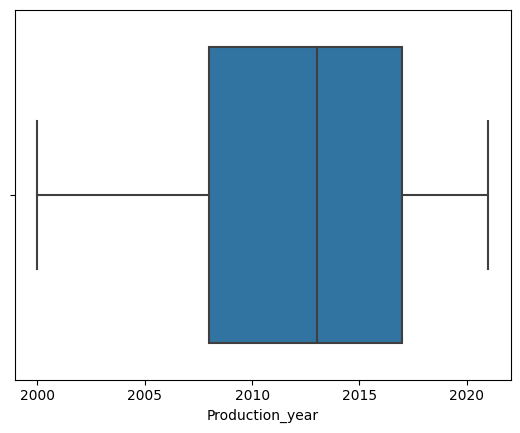

Mileage_km


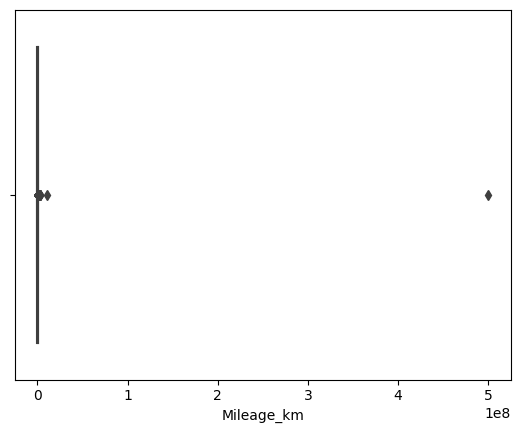

Power_HP


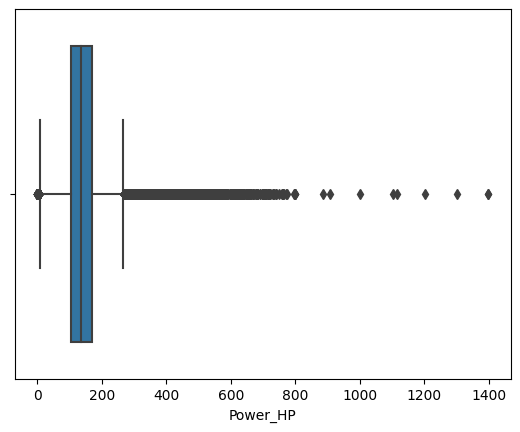

Doors_number


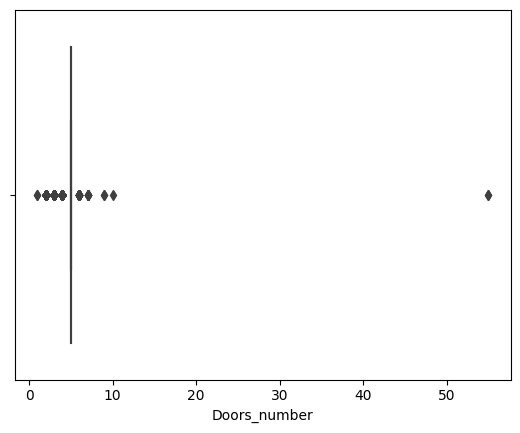

Price_PLN


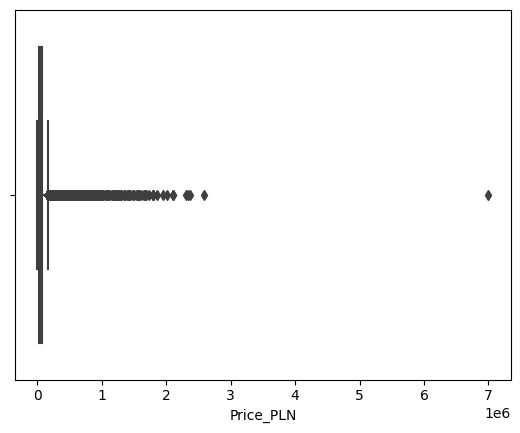

Production_year


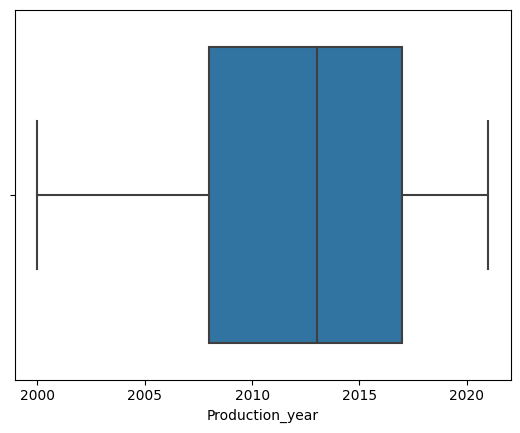

Mileage_km


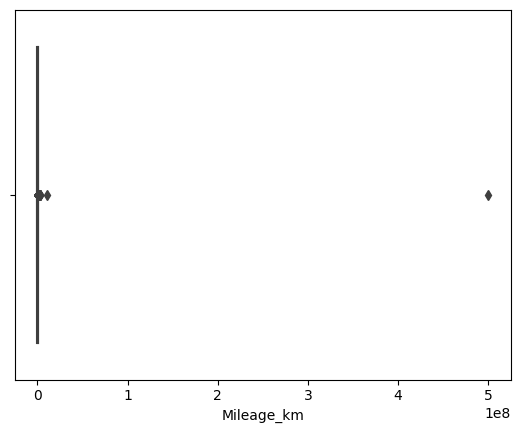

Power_HP


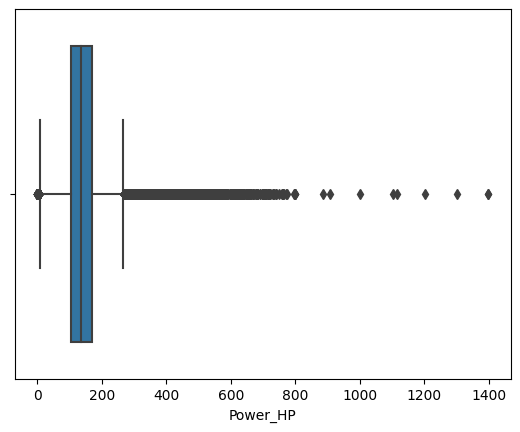

Doors_number


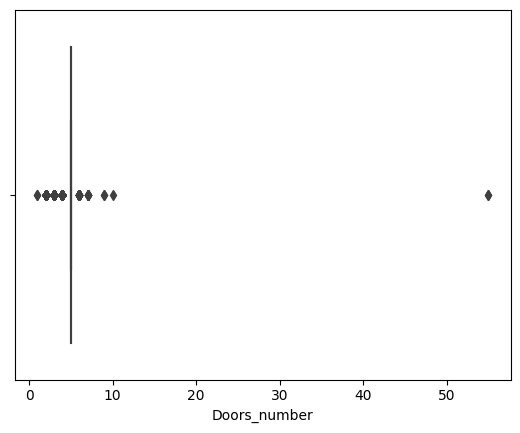

Price_PLN


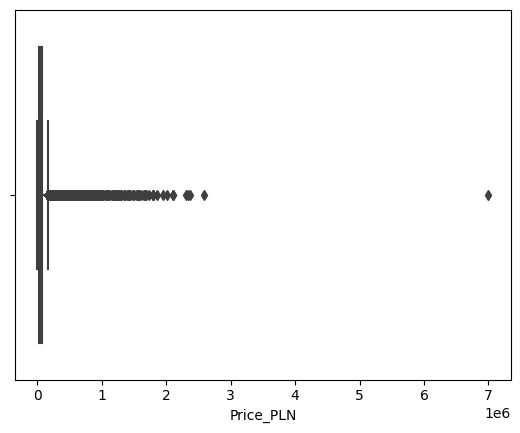

In [139]:
for col in data.select_dtypes('number').columns :
    plt.show()
    sns.boxplot(x = col, data=data)
    print(col)




**Removing the outliers from the numerical columns**

In [140]:
data['Mileage_km'].value_counts()

1.0         8578
5.0         6329
10.0        2989
180000.0    1117
220000.0    1114
            ... 
50482.0        1
4530.0         1
25844.0        1
61605.0        1
192470.0       1
Name: Mileage_km, Length: 50385, dtype: int64

1.0         8578
5.0         6329
10.0        2989
180000.0    1117
220000.0    1114
            ... 
50482.0        1
4530.0         1
25844.0        1
61605.0        1
192470.0       1
Name: Mileage_km, Length: 50385, dtype: int64

In [141]:
print(data['Mileage_km'].mean())
print(data['Mileage_km'].min())
print(data['Mileage_km'].max())

140636.70971545315
1.0
500000000.0
140636.70971545315
1.0
500000000.0


In [142]:
data['Doors_number'].unique()

array([ 3.,  2.,  5.,  4.,  6.,  1.,  7., 10.,  9., 55.])

array([ 3.,  2.,  5.,  4.,  6.,  1.,  7., 10.,  9., 55.])

In [143]:
data[data['Doors_number']>5].count()

Condition          61
Vehicle_brand      61
Vehicle_model      61
Production_year    61
Mileage_km         61
Power_HP           61
Fuel_type          61
Transmission       61
Type               61
Doors_number       61
Colour             61
Price_PLN          61
Country            61
dtype: int64

Condition          61
Vehicle_brand      61
Vehicle_model      61
Production_year    61
Mileage_km         61
Power_HP           61
Fuel_type          61
Transmission       61
Type               61
Doors_number       61
Colour             61
Price_PLN          61
Country            61
dtype: int64

In [144]:
data['Doors_number'].value_counts()

5.0     153754
4.0      25487
3.0      11698
2.0       5767
6.0         48
7.0          8
1.0          2
9.0          2
55.0         2
10.0         1
Name: Doors_number, dtype: int64

5.0     153754
4.0      25487
3.0      11698
2.0       5767
6.0         48
7.0          8
1.0          2
9.0          2
55.0         2
10.0         1
Name: Doors_number, dtype: int64

In [145]:
data = data.loc[data['Doors_number'] <= 5]
data.reset_index(inplace=True,drop=True)

In [146]:
data['Doors_number'].value_counts()

5.0    153754
4.0     25487
3.0     11698
2.0      5767
1.0         2
Name: Doors_number, dtype: int64

5.0    153754
4.0     25487
3.0     11698
2.0      5767
1.0         2
Name: Doors_number, dtype: int64

In [147]:
data['Price_PLN'].describe()

count    1.967080e+05
mean     6.225864e+04
std      8.435543e+04
min      1.126126e+02
25%      1.790000e+04
50%      3.590000e+04
75%      7.500000e+04
max      6.999000e+06
Name: Price_PLN, dtype: float64

count    1.967080e+05
mean     6.225864e+04
std      8.435543e+04
min      1.126126e+02
25%      1.790000e+04
50%      3.590000e+04
75%      7.500000e+04
max      6.999000e+06
Name: Price_PLN, dtype: float64

In [148]:
data[data["Power_HP"]>800].count()

Condition          9
Vehicle_brand      9
Vehicle_model      9
Production_year    9
Mileage_km         9
Power_HP           9
Fuel_type          9
Transmission       9
Type               9
Doors_number       9
Colour             9
Price_PLN          9
Country            9
dtype: int64

Condition          9
Vehicle_brand      9
Vehicle_model      9
Production_year    9
Mileage_km         9
Power_HP           9
Fuel_type          9
Transmission       9
Type               9
Doors_number       9
Colour             9
Price_PLN          9
Country            9
dtype: int64

In [149]:
#data = data.loc[data['Power_HP'] <=800]
data = data.drop(data[data['Power_HP'] >800].index)
data.reset_index(inplace=True,drop=True)

In [150]:
data[data["Price_PLN"]>1500000].count()


Condition          28
Vehicle_brand      28
Vehicle_model      28
Production_year    28
Mileage_km         28
Power_HP           28
Fuel_type          28
Transmission       28
Type               28
Doors_number       28
Colour             28
Price_PLN          28
Country            28
dtype: int64

Condition          28
Vehicle_brand      28
Vehicle_model      28
Production_year    28
Mileage_km         28
Power_HP           28
Fuel_type          28
Transmission       28
Type               28
Doors_number       28
Colour             28
Price_PLN          28
Country            28
dtype: int64

In [151]:
#data = data.loc[data['Price_PLN'] <=1500000]
data = data.drop(data[data['Price_PLN'] >1500000].index)
data.reset_index(inplace=True,drop=True)

# **visualization all the numerical columns after removing the outliers**

In [152]:
for col in data.select_dtypes('number').columns :
    #plt.show()
    fig=px.box(x=data[col])
    #sns.boxplot(x = col, data=data)
    print(col)
    fig.show()


Production_year


Mileage_km


Power_HP


Doors_number


Price_PLN


Production_year


Mileage_km


Power_HP


Doors_number


Price_PLN


In [153]:
data.shape

(196671, 13)

(196671, 13)

# **univariate analysis for all categorical columns**

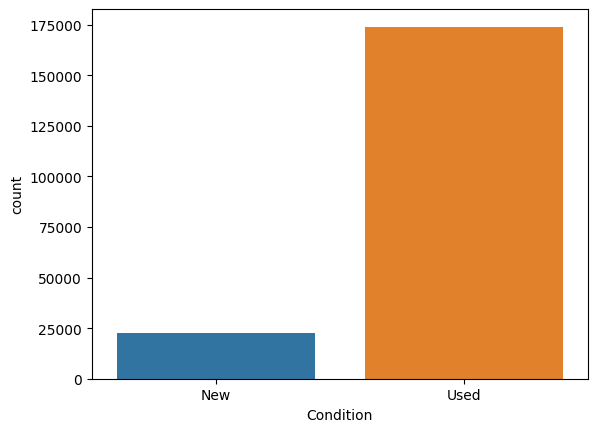

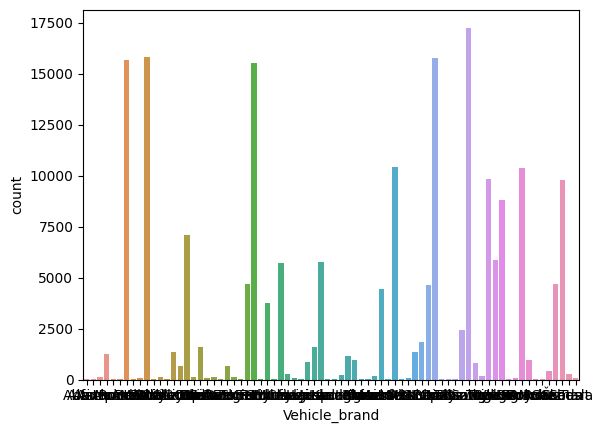

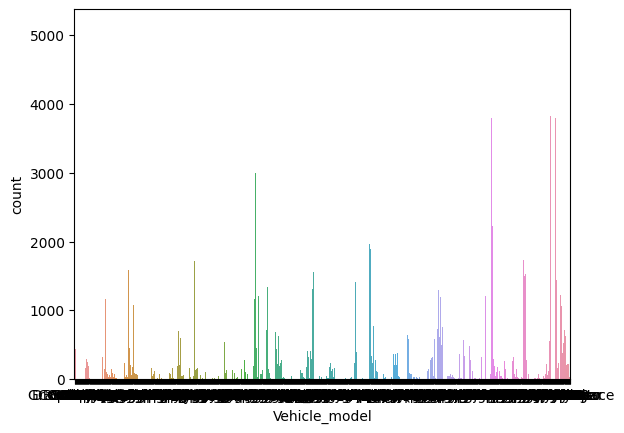

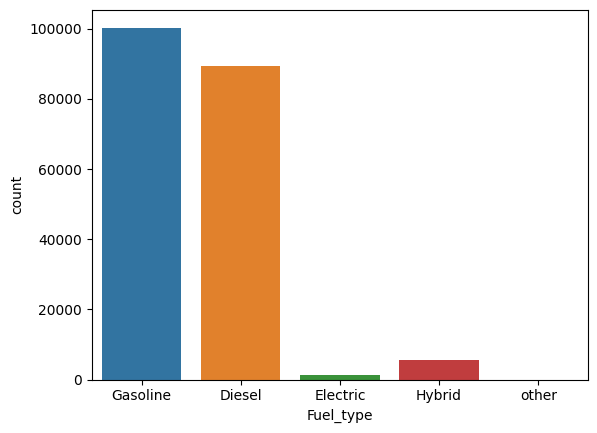

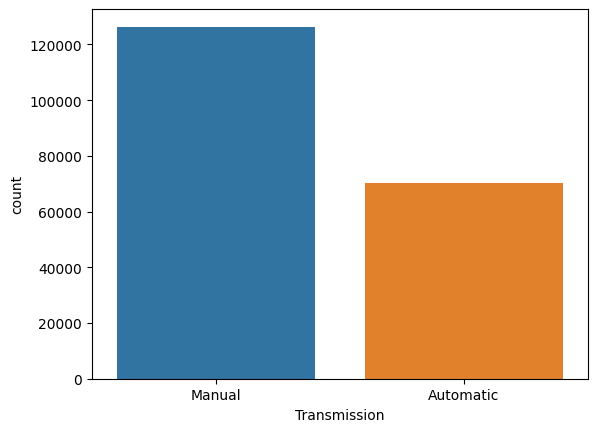

...

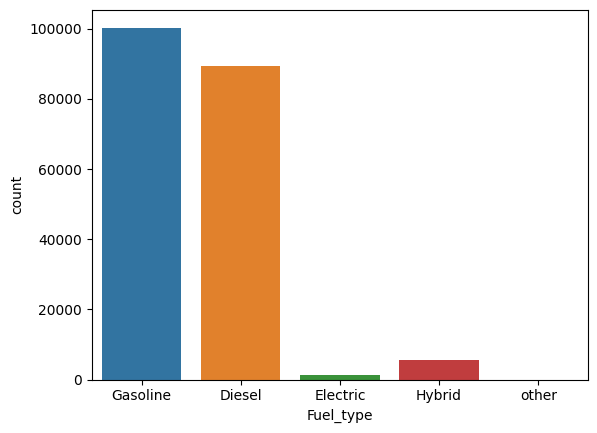

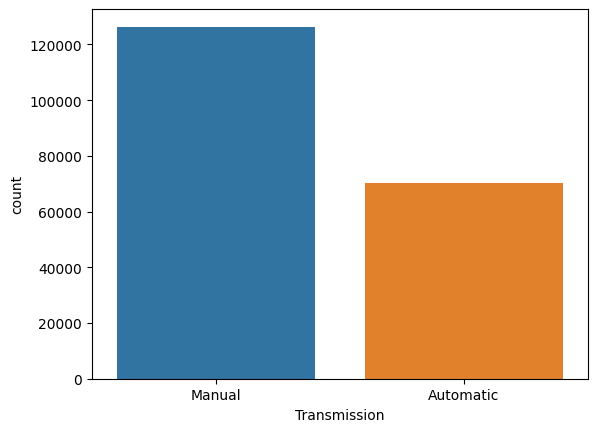

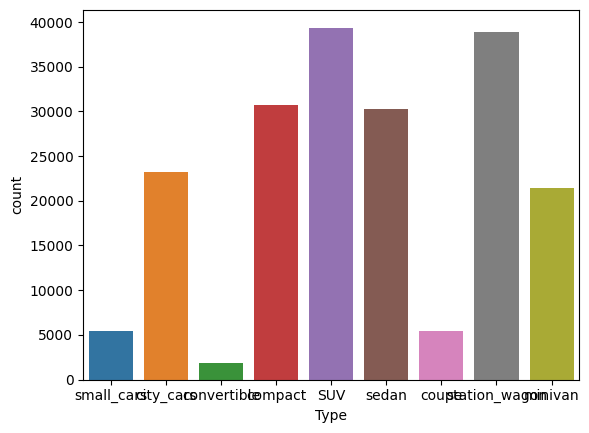

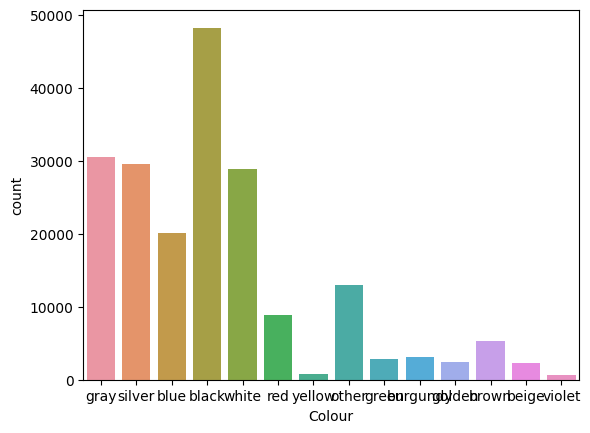

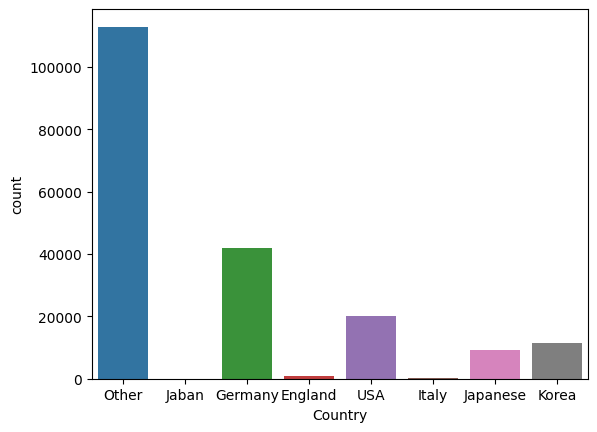

In [154]:
for col in data.select_dtypes('object').columns :

    plt.figure()
    sns.countplot(x = data[col])



# **Heatmab to see the correlation between all columns**

<ipython-input-57-3dc49967d09b>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

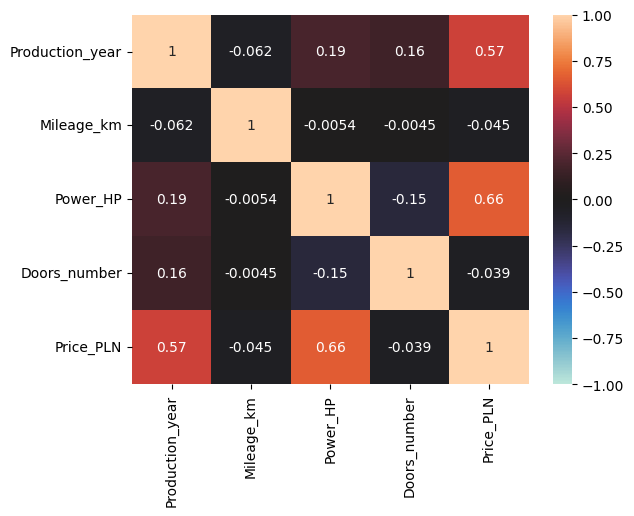

<ipython-input-155-3dc49967d09b>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<Axes: >

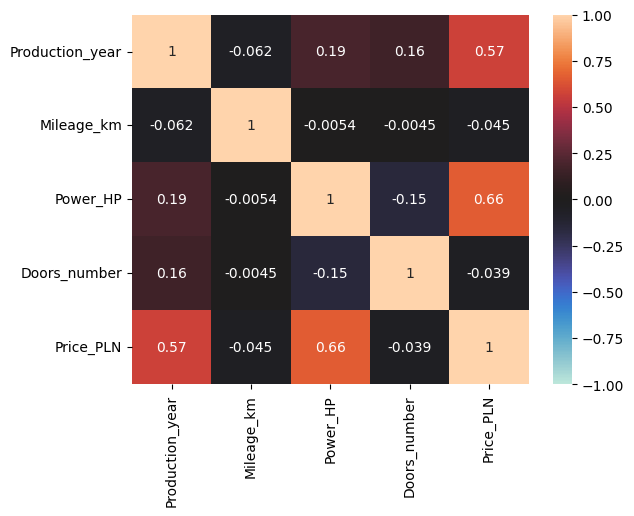

In [155]:
features_correlation = data.corr()
sns.heatmap(features_correlation, annot=True, vmin=-1, vmax=1, center=0)

# **Bivariate analysis Between all columns and the target**

<Axes: xlabel='Doors_number', ylabel='Price_PLN'>

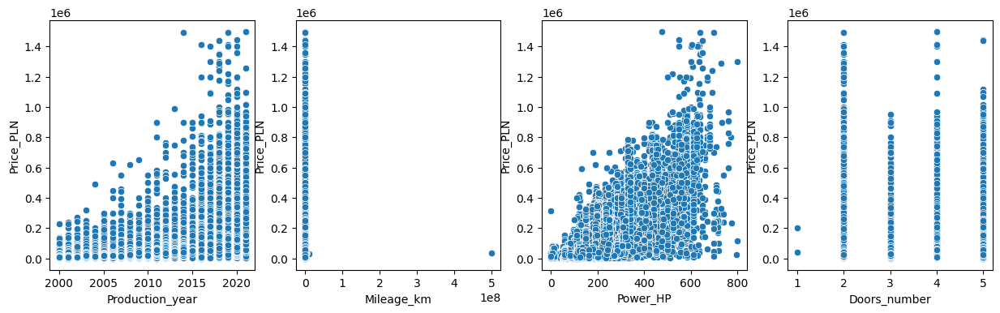

<Axes: xlabel='Doors_number', ylabel='Price_PLN'>

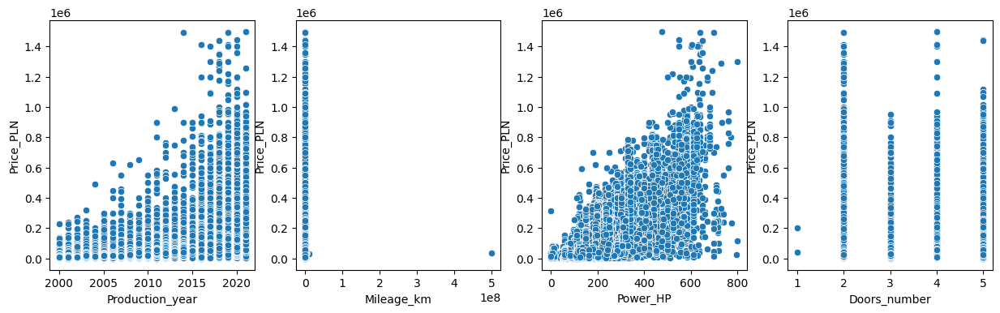

In [156]:
fig, axes = plt.subplots(1, 4, figsize=(15, 4))
sns.scatterplot(x='Production_year', y='Price_PLN', data=data, ax=axes[0])
sns.scatterplot(x='Mileage_km', y='Price_PLN', data=data, ax=axes[1])
sns.scatterplot(x='Power_HP', y='Price_PLN', data=data, ax=axes[2])
sns.scatterplot(x='Doors_number', y='Price_PLN', data=data, ax=axes[3])


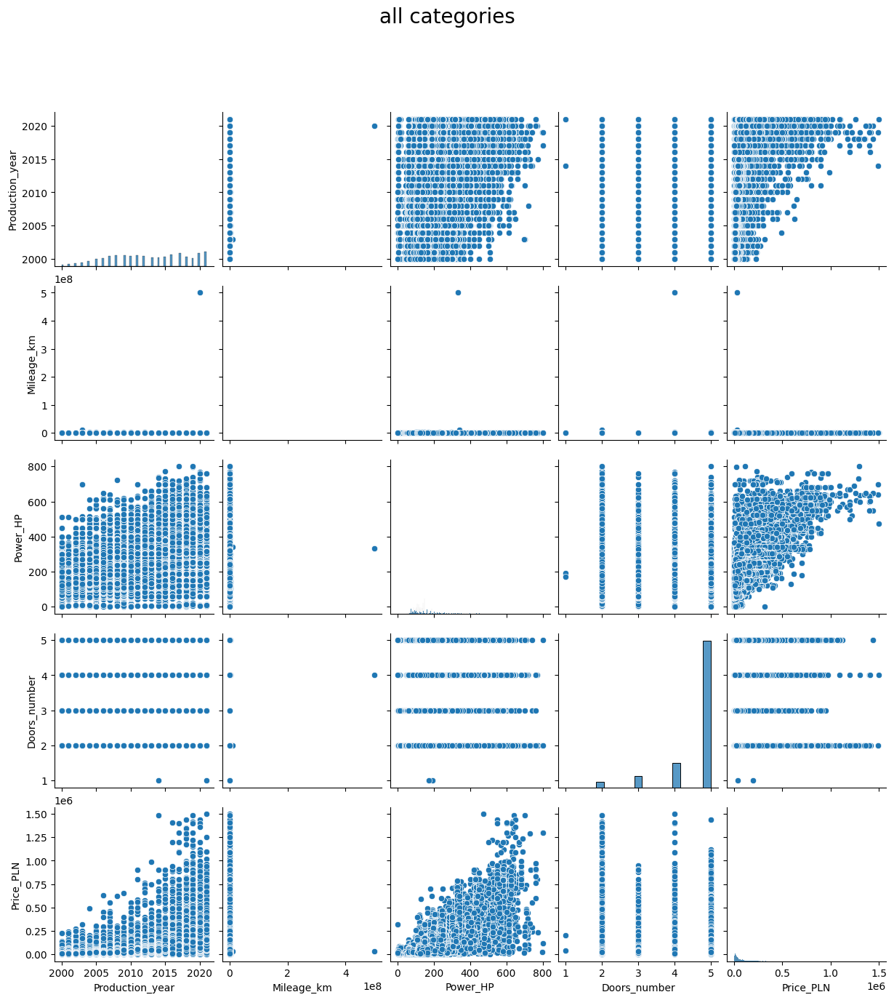

In [59]:
ax = sns.pairplot(data)
ax.fig.suptitle('all categories', fontsize = 20, y = 1.1)
ax;

In [60]:
data.columns

Index(['Condition', 'Vehicle_brand', 'Vehicle_model', 'Production_year',
       'Mileage_km', 'Power_HP', 'Fuel_type', 'Transmission', 'Type',
       'Doors_number', 'Colour', 'Price_PLN', 'Country'],
      dtype='object')

# **Data Preprocessing and Modeling**

In [61]:
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer  # paralell
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import cross_validate
from datasist.structdata import detect_outliers
from category_encoders import BinaryEncoder
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler , StandardScaler , RobustScaler
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.naive_bayes import MultinomialNB , GaussianNB , BernoulliNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, r2_score
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import KFold
from xgboost import XGBRegressor




In [62]:
for col in data.select_dtypes('object').columns:
    print(f'{col} -- {data[col].nunique()}')

Condition -- 2
Vehicle_brand -- 74
Vehicle_model -- 969
Fuel_type -- 5
Transmission -- 2
Type -- 9
Colour -- 14
Country -- 8


# **Drop the unwanted columns**

In [63]:
data.drop(['Vehicle_model','Country','Doors_number','Colour','Vehicle_brand'], axis=1 , inplace=True)

In [64]:
data.reset_index(inplace=True,drop=True)


In [65]:
data.columns

Index(['Condition', 'Production_year', 'Mileage_km', 'Power_HP', 'Fuel_type',
       'Transmission', 'Type', 'Price_PLN'],
      dtype='object')

In [66]:
for col in data.select_dtypes('object').columns:
    print(f'{col} -- {data[col].nunique()}')

Condition -- 2
Fuel_type -- 5
Transmission -- 2
Type -- 9


# **Encoding the categorical columns**

In [67]:
transformer = ColumnTransformer(transformers=[
    ('ohe' , OneHotEncoder(sparse_output=False , drop = 'first'),['Condition','Fuel_type','Transmission'] ) ,
    ('be' ,BinaryEncoder() , ['Type'])
] , remainder='passthrough')

transformer

ColumnTransformer(remainder='passthrough',
                  transformers=[('ohe',
                                 OneHotEncoder(drop='first',
                                               sparse_output=False),
                                 ['Condition', 'Fuel_type', 'Transmission']),
                                ('be', BinaryEncoder(), ['Type'])])

In [68]:
data.head()

,Condition,Production_year,Mileage_km,Power_HP,Fuel_type,Transmission,Type,Price_PLN
0,New,2021,1.0,145.0,Gasoline,Manual,small_cars,86200.0
1,Used,2018,52000.0,180.0,Gasoline,Automatic,small_cars,44900.0
2,Used,2012,29000.0,160.0,Gasoline,Manual,small_cars,39900.0
3,New,2021,600.0,165.0,Gasoline,Manual,small_cars,97900.0
4,Used,2016,46060.0,180.0,Gasoline,Manual,small_cars,62950.0


In [69]:
data.describe()

,Production_year,Mileage_km,Power_HP,Price_PLN
count,196671.000000,1.966710e+05,196671.000000,1.966710e+05
mean,2012.628400,1.406581e+05,151.660860,6.198020e+04
std,5.565066,1.131624e+06,76.355261,8.020064e+04
min,2000.000000,1.000000e+00,1.000000,1.126126e+02
25%,2008.000000,5.432700e+04,105.000000,1.790000e+04
50%,2013.000000,1.447050e+05,136.000000,3.590000e+04
75%,2017.000000,2.050000e+05,170.000000,7.500000e+04
max,2021.000000,5.000000e+08,800.000000,1.500000e+06


In [70]:
data.shape

(196671, 8)

In [71]:
x , y = data.drop(['Price_PLN'] , axis = 1 ) , data['Price_PLN']

In [72]:
x.shape

(196671, 7)

In [73]:
y.shape

(196671,)

# **Compare between different model accuracy**

In [74]:
import xgboost as xgb
Models = [

    ('DTR', DecisionTreeRegressor()),
    ('RF',RandomForestRegressor()),
    ('XGB', XGBRegressor())


]

In [75]:
for model in Models :

    steps = []
    steps.append( ('transformer' , transformer)  )
    steps.append(  ( 'sclr' , RobustScaler() ) )
    steps.append( model  )

    PL = Pipeline(steps=steps)

    scores = cross_validate(estimator = PL , X = x , y = y , cv=KFold(n_splits=5),
                        scoring='r2' , return_train_score=True )

    print(model[0])

    print(scores['train_score'].mean())
    print(scores['test_score'].mean())

    print('-------------------------------------')

LR
0.681802469686749
-11.900009473503703
-------------------------------------
DTR
0.9918925097466097
0.6580933098312998
-------------------------------------
RF
0.9789495593644004
0.7909717175368808
-------------------------------------
XGB
0.9194836100124721
0.8021244931050034
-------------------------------------


# **Tuning the Hyper parameters for the XGBOOST**

In [76]:
params = {
    'Model__learning_rate': [0.01, 0.1, 0.2],
    'Model__n_estimators': [300,400,500],
    'Model__reg_alpha': [0.01,0.1,0.2,0.9]

}

In [77]:
steps = []
steps.append(("Encoder" ,transformer))
steps.append(("Scaler" , StandardScaler()))
steps.append(("Model" , XGBRegressor()))
pipeline_ = Pipeline(steps=steps)

In [78]:
from sklearn.model_selection import GridSearchCV
grid_search = GridSearchCV(estimator=pipeline_ , param_grid=params, cv =5 ,scoring="r2" , return_train_score=True , n_jobs = -1)
grid_search.fit(x,y)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         OneHotEncoder(drop='first',
                                                                                       sparse_output=False),
                                                                         ['Condition',
                                                                          'Fuel_type',
                                                                          'Transmission']),
                                                                        ('be',
                                                                         BinaryEncoder(),
                                                                         ['Type'])])),
                                       ('Scaler', StandardScaler()),
                                       ('Model',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_byl...
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=None, ...))]),
             n_jobs=-1,
             param_grid={'Model__learning_rate': [0.01, 0.1, 0.2],
                         'Model__n_estimators': [300, 400, 500],
                         'Model__reg_alpha': [0.01, 0.1, 0.2, 0.9]},
             return_train_score=True, scoring='r2')

In [79]:
grid_search.best_params_

{'Model__learning_rate': 0.01,
 'Model__n_estimators': 400,
 'Model__reg_alpha': 0.9}

In [80]:
grid_search.cv_results_["mean_train_score"].mean()*100

91.50289736613507

In [81]:
grid_search.cv_results_["mean_test_score"].mean()*100

80.29279615110292

In [82]:
grid_search.best_estimator_

Pipeline(steps=[('Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  ['Condition', 'Fuel_type',
                                                   'Transmission']),
                                                 ('be', BinaryEncoder(),
                                                  ['Type'])])),
                ('Scaler', StandardScaler()),
                ('Model',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=N...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.01,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=400, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [83]:
final_model = grid_search.best_estimator_

#**Tuning the parameters of the Random Forest model**

In [84]:
from sklearn.feature_selection import SelectFromModel

RF= make_pipeline(transformer ,
                   PolynomialFeatures(),
                   StandardScaler(),
                   SelectFromModel(estimator=RandomForestRegressor(), max_features=5),
                   RandomForestRegressor()
                  )
RF

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  ['Condition', 'Fuel_type',
                                                   'Transmission']),
                                                 ('be', BinaryEncoder(),
                                                  ['Type'])])),
                ('polynomialfeatures', PolynomialFeatures()),
                ('standardscaler', StandardScaler()),
                ('selectfrommodel',
                 SelectFromModel(estimator=RandomForestRegressor(),
                                 max_features=5)),
                ('randomforestregressor', RandomForestRegressor())])

In [85]:
RF.steps

[('columntransformer',
  ColumnTransformer(remainder='passthrough',
                    transformers=[('ohe',
                                   OneHotEncoder(drop='first',
                                                 sparse_output=False),
                                   ['Condition', 'Fuel_type', 'Transmission']),
                                  ('be', BinaryEncoder(), ['Type'])])),
 ('polynomialfeatures', PolynomialFeatures()),
 ('standardscaler', StandardScaler()),
 ('selectfrommodel',
  SelectFromModel(estimator=RandomForestRegressor(), max_features=5)),
 ('randomforestregressor', RandomForestRegressor())]

In [86]:
RF_params = [
   {
    'randomforestregressor__n_estimators': [100, 200, 500],
    'randomforestregressor__max_depth': [3, 5, 10],
    'randomforestregressor__min_samples_leaf': [1, 5, 10]
}
]

In [87]:
from sklearn.model_selection import GridSearchCV
RFD = GridSearchCV(estimator=pipeline_ , param_grid=params, cv =5 ,scoring="r2" , return_train_score=True , n_jobs = -1)

RFD.fit(x, y)


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('Encoder',
                                        ColumnTransformer(remainder='passthrough',
                                                          transformers=[('ohe',
                                                                         OneHotEncoder(drop='first',
                                                                                       sparse_output=False),
                                                                         ['Condition',
                                                                          'Fuel_type',
                                                                          'Transmission']),
                                                                        ('be',
                                                                         BinaryEncoder(),
                                                                         ['Type'])])),
                                       ('Scaler', StandardScaler()),
                                       ('Model',
                                        XGBRegressor(base_score=None,
                                                     booster=None,
                                                     callbacks=None,
                                                     colsample_byl...
                                                     max_depth=None,
                                                     max_leaves=None,
                                                     min_child_weight=None,
                                                     missing=nan,
                                                     monotone_constraints=None,
                                                     multi_strategy=None,
                                                     n_estimators=None,
                                                     n_jobs=None,
                                                     num_parallel_tree=None,
                                                     random_state=None, ...))]),
             n_jobs=-1,
             param_grid={'Model__learning_rate': [0.01, 0.1, 0.2],
                         'Model__n_estimators': [300, 400, 500],
                         'Model__reg_alpha': [0.01, 0.1, 0.2, 0.9]},
             return_train_score=True, scoring='r2')

In [88]:
RFD.best_params_

{'Model__learning_rate': 0.01,
 'Model__n_estimators': 400,
 'Model__reg_alpha': 0.9}

In [89]:
RFD.cv_results_["mean_train_score"].mean()*100

91.50289736613507

In [90]:
RFD.cv_results_["mean_test_score"].mean()*100

80.29279615110292

In [91]:
RFD.best_estimator_

Pipeline(steps=[('Encoder',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  OneHotEncoder(drop='first',
                                                                sparse_output=False),
                                                  ['Condition', 'Fuel_type',
                                                   'Transmission']),
                                                 ('be', BinaryEncoder(),
                                                  ['Type'])])),
                ('Scaler', StandardScaler()),
                ('Model',
                 XGBRegressor(base_score=None, booster=None, callbacks=None,
                              colsample_bylevel=None, colsample_bynode=N...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.01,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=400, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [92]:
final_model = RFD.best_estimator_

# **Streamlit**

In [93]:

import joblib

In [94]:

joblib.dump(final_model , "Model.pkl")
joblib.dump(x.columns , "Inputs.pkl")

['Inputs.pkl']

In [95]:
data.columns

Index(['Condition', 'Production_year', 'Mileage_km', 'Power_HP', 'Fuel_type',
       'Transmission', 'Type', 'Price_PLN'],
      dtype='object')

In [96]:
!pip install streamlit
import streamlit as st

import joblib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 39.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.6/190.6 kB 12.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 66.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 82.1/82.1 kB 7.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.1 MB/s eta 0:00:00


In [97]:

%%writefile streamlit_app_3rd.py
import streamlit as st
import pandas as pd
import joblib

import sklearn
from xgboost import XGBRegressor


Inputs = joblib.load("Inputs.pkl")
Model = joblib.load("Model.pkl")

def prediction(Condition,Fuel_type,Transmission,Type,Production_year,Mileage_km,Power_HP):
    test_df = pd.DataFrame(columns=Inputs)
    test_df.at[0,"Condition"] = Condition
    test_df.at[0,"Fuel_type"] = Fuel_type
    test_df.at[0,"Transmission"] = Transmission
    test_df.at[0,"Type"] = Type
    test_df.at[0,"Production_year"] = Production_year
    test_df.at[0,"Mileage_km"] = Mileage_km
    test_df.at[0,"Power_HP"] = Power_HP
    st.dataframe(test_df)
    result = Model.predict(test_df)[0]
    return result


def main():
    st.title("Used Car prediction")
    Condition = st.selectbox("Condition" , ['New', 'Used'])
    Fuel_type = st.selectbox("Fuel_type" , ['Gasoline', 'Diesel', 'Electric', 'Hybrid', 'other'])
    Transmission = st.selectbox("Transmission" , ['Manual', 'Automatic'])
    Type = st.selectbox("Type" , ['small_cars', 'city_cars', 'convertible', 'compact', 'SUV',
       'sedan', 'coupe', 'station_wagon', 'minivan'])
    Production_year = st.slider("Dep_Time" , min_value= 2000 , max_value=2021 , value=0,step=1)
    Mileage_km = st.slider("Arrival_Time" , min_value= 0 , max_value=500000000 , value=0,step=100)
    Power_HP = st.slider("Arrival_Time" , min_value= 69 , max_value=1398.0 , value=0,step=100)



    if st.button("predict"):

        result = prediction(Condition,Fuel_type,Transmission,Type,Production_year,Mileage_km,Power_HP)
        st.success(f'Fair Price will be around . {result}')

if __name__ == '__main__':
        main()

Writing streamlit_app_3rd.py


In [98]:

!python --version

Python 3.10.12
